# Convolutional Neural Process

Last Update : 13 June 2019

In [14]:
N_THREADS = 8
# Nota Bene : notebooks don't deallocate GPU memory
IS_FORCE_CPU = False # can also be set in the trainer

In [15]:
is_mini = False

## Environment

In [16]:
cd ..

/


In [17]:
%autosave 600
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# CENTER PLOTS
from IPython.core.display import HTML
display(HTML(""" <style> .output_png {display: table-cell; text-align: center; margin:auto; }
.prompt display:none;}  </style>"""))

import os
if IS_FORCE_CPU:
    os.environ['CUDA_VISIBLE_DEVICES'] = ""

import sys
sys.path.append("notebooks")

import numpy as np
import matplotlib.pyplot as plt
import torch
torch.set_num_threads(N_THREADS)

Autosaving every 600 seconds


## Dataset

In this notebook I only look at the periodic and mattern kernel. See [Tutorial 1 - Conditional Neural Process] for more details.

[Tutorial 1 - Conditional Neural Process]: Tutorial%201%20-%20Conditional%20Neural%20Process.ipynb

In [18]:
from sklearn.gaussian_process.kernels import RBF, Matern, ExpSineSquared, DotProduct, ConstantKernel, WhiteKernel
from ntbks_viz import plot_posterior_samples, plot_prior_samples, plot_dataset_samples

from ntbks_datasets import GPDataset

In [19]:
X_DIM = 1  # 1D spatial input
Y_DIM = 1  # 1D regression
N_POINTS = 128
N_SAMPLES = 20000 # this is a lot and can work with less

In [20]:
datasets = dict()
kwargs = dict(n_samples=N_SAMPLES, n_points=N_POINTS)
datasets["rbf"] = GPDataset(kernel=1.0 * RBF(length_scale=1.0,
                                             length_scale_bounds=(1e-1, 10.0)),
                            **kwargs)

datasets["periodic"] = GPDataset(kernel=1.0 * ExpSineSquared(length_scale=1.0,
                                                             periodicity=3.0,
                                                             length_scale_bounds=(0.1, 10.0),
                                                             periodicity_bounds=(1.0, 10.0)),
                                 **kwargs)
datasets["non-stationary"] = GPDataset(kernel=(ConstantKernel(0.1, (0.01, 10.0)) *
                                               (DotProduct(sigma_0=1.0,
                                                           sigma_0_bounds=(0.1, 10.0)) ** 2)),
                                       **kwargs)
datasets["matern"] = GPDataset(kernel=1.0 * Matern(length_scale=1.0,
                                                   length_scale_bounds=(1e-1, 10.0),
                                                   nu=1.5),
                               **kwargs)

datasets["noisy-matern"] = GPDataset(kernel=1.0 * Matern(length_scale=1.0,
                                                   length_scale_bounds=(1e-1, 10.0),
                                                   nu=1.5) + WhiteKernel(noise_level=.5), 
                                     **kwargs)

## Model


In [21]:
from torch.distributions import Normal
import torch.nn as nn

from skssl.transformers import NeuralProcessLoss, AttentiveNeuralProcess
from skssl.predefined import MLP, merge_flat_input, get_uninitialized_mlp
from skssl.transformers.neuralproc.datasplit import context_target_split
from skssl.utils.torchextend import ReturnInput

In [22]:
R_DIM = 64
if is_mini:
    RANGE_CNTXT = (2, 2)  # context points will be sampled uniformly in this range
    RANGE_TRGTS = (1, 1)  # extra number of targtes points 
else:
    RANGE_CNTXT = (.1, .5)
    RANGE_TRGTS = (.2, .99) # usually add cntxt => sees between .2 and 1 so fo same here to compare

In [97]:
make_Xy_input(dataset)

({'X': <skssl.training.helpers.get_only_first_item.<locals>.FirstIndex at 0x7f893cd1f780>,
  'y': tensor([[[ 1.2244],
           [-0.1495],
           [ 1.7381],
           ...,
           [ 0.2926],
           [-0.7489],
           [-0.1474]],
  
          [[ 0.1654],
           [ 0.0639],
           [ 0.0627],
           ...,
           [-0.3900],
           [-1.3072],
           [-0.5576]],
  
          [[-0.0534],
           [ 0.7430],
           [ 0.1242],
           ...,
           [-1.8785],
           [-0.3051],
           [-1.1253]],
  
          ...,
  
          [[ 1.5118],
           [ 2.9717],
           [ 1.6918],
           ...,
           [-0.0859],
           [-0.2252],
           [ 1.0042]],
  
          [[ 1.0553],
           [-0.2603],
           [ 0.9925],
           ...,
           [ 1.1842],
           [ 0.0637],
           [-0.9108]],
  
          [[-1.7260],
           [-2.7049],
           [-1.0668],
           ...,
           [-0.0681],
           [ 0.9707],


In [23]:
def get_cntxt_trgt(*args):
    return context_target_split(*args, 
                                range_cntxts=RANGE_CNTXT, 
                                range_trgts=RANGE_TRGTS, 
                                is_add_cntxts_to_trgts=False, # don't add all cntxt to target for CNN Neural Process
                                is_all_trgts=False) 


def init_model(**kwargs):
    return AttentiveNeuralProcess(X_DIM, Y_DIM,
                         XEncoder=nn.Identity,
                         XYEncoder=lambda *args: ReturnInput(2),  # return y 
                         Decoder=lambda *args: ReturnInput(2),  # return y 
                         PredictiveDistribution=Normal, 
                          get_cntxt_trgt=get_cntxt_trgt,
                          attention="generalized_conv", # parameter free attention because simple task
                          encoded_path="deterministic", # use both latent  and deterministic path as in paper
                          n_conv=5,
                          is_concat=True,
                          kernel_size=7,
                          is_normalize=True,
                          is_batchnorm=False,
                          dilation=2,
                          is_depth_separable_conv=True,
                          is_u_style=False,
                         **kwargs) # don't normalize

In [24]:
# initialize one model for each dataset
data_models = {name: [init_model(), data]
               for name, data in datasets.items()}

### N Param

Number of parameters (note that I did not play around with this much, this depends a lot on the representation size):

In [25]:
from utils.helpers import count_parameters

In [26]:
for k, (neural_proc, dataset) in data_models.items():
    print("N Param:", count_parameters(neural_proc))
    break

N Param: 7049


The increase of parameters doesn't come from attention (as the attention is parameter free in this case), but from the fact that we have a deterministic and a latent path. Using only a deterministic path, the model can be very small. See the following notebook to see such a model with only 35682 parameters : [Small Multihead Conditional Attentive Neural Process]

[Small Multihead Conditional Attentive Neural Process]: Small%20Multihead%20Conditional%20Attentive%20Neural%20Process.ipynb

## Training

In [27]:
import torch.nn as nn
from skorch.callbacks import ProgressBar, Checkpoint
from skopt import BayesSearchCV

from skssl.training import NeuralNetTransformer
from skssl.training.helpers import make_Xy_input
from skorch.helper import predefined_split
from skorch.dataset import Dataset

/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


Nota Bene: using a small batch size is probably important as we use fix amount of context in batch, and with attention you don't have aggregation => the number of context points changes the attention mechanism (the softmax) => use small to have many different number of context points but we want a fair comparison so keep `learning rate=1e-3` and `batch_size=64` like other notebook.

In [28]:
N_EPOCHS = 50 # 30 is enough
if is_mini:
    BATCH_SIZE = 1
else:
    BATCH_SIZE = 256
is_RETRAIN = True # if false load precomputed

In [29]:
for k,(neural_proc, dataset) in data_models.items():
    
    
    print()
    print("--- {} {} ---".format("Training" if is_RETRAIN else "Loading", k))
    print()
    
    
    model = NeuralNetTransformer(neural_proc, 
                                 lambda *args: NeuralProcessLoss(*args, is_mean=True),
                                 max_epochs=N_EPOCHS,
                                 batch_size=BATCH_SIZE,
                                 train_split=None,  # don't use cross validation dev set
                                 lr=1e-3, # they use 5e-5 because 16 batch size but that would be slow
                                 callbacks=[ProgressBar()], # checkpoint best model
                                ) 
    
    if is_RETRAIN:
        _=model.fit(*make_Xy_input(dataset))
    
    


--- Training rbf ---



KeyboardInterrupt: 

In [36]:
EXTRAP_DISTANCE = 3  # add 2 to the right for extrapolation
INTERPOLATION_RANGE = dataset.min_max
EXTRAPOLATION_RANGE = (dataset.min_max[0], dataset.min_max[1]+EXTRAP_DISTANCE )

In [37]:
from skssl.utils.helpers import rescale_range
for k,(neural_proc, dataset) in data_models.items():
    extrap_rescaled_range = tuple(rescale_range(np.array(EXTRAPOLATION_RANGE), (-5,5), (-1,1)))
    neural_proc.attender.extend_tmp_queries(extrap_rescaled_range)

# Posterior

In [34]:
for k,(neural_proc, dataset) in data_models.items():
    break

In [35]:
neural_proc.attender.radial_func.length_scale

Parameter containing:
tensor([-3.1572], requires_grad=True)

Parameter containing:
tensor([-3.1572], requires_grad=True)

In [36]:
torch.nn.functional.softplus(neural_proc.attender.radial_func.length_scale)

tensor([0.0417], grad_fn=<SoftplusBackward>)

tensor([0.0417], grad_fn=<SoftplusBackward>)

std: 0.6597064137458801
std: 0.6597064137458801
std: 0.2544579803943634
std: 0.2544579803943634
std: 2.4808833599090576
std: 2.4808833599090576
std: 0.31525519490242004
std: 0.31525519490242004
std: 1.033363938331604
std: 1.033363938331604


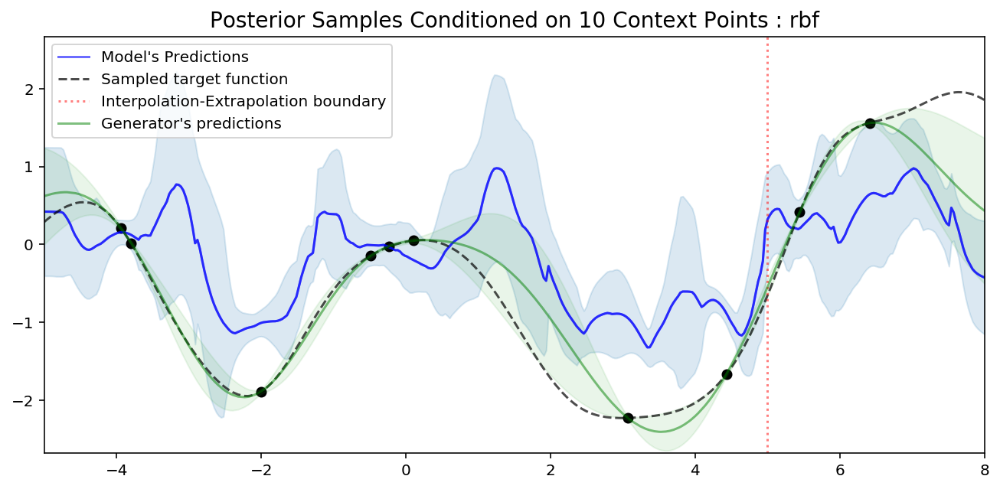

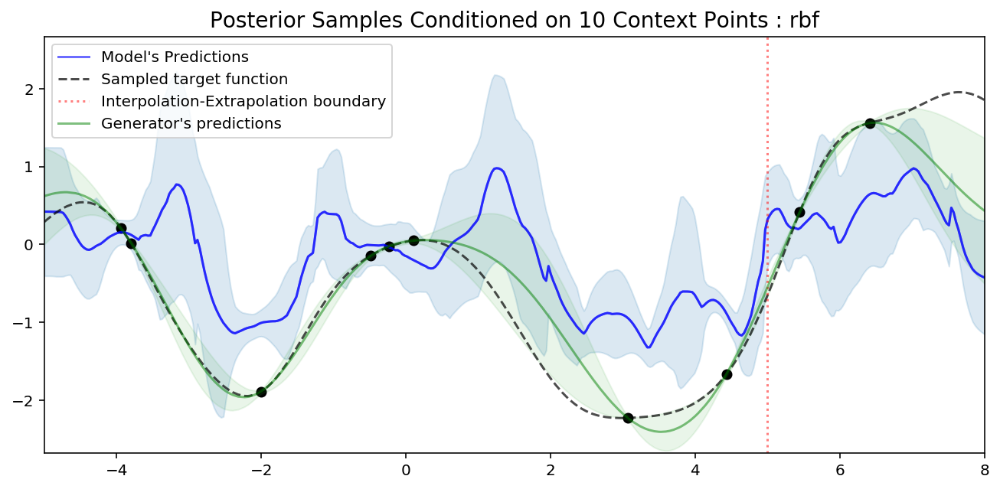

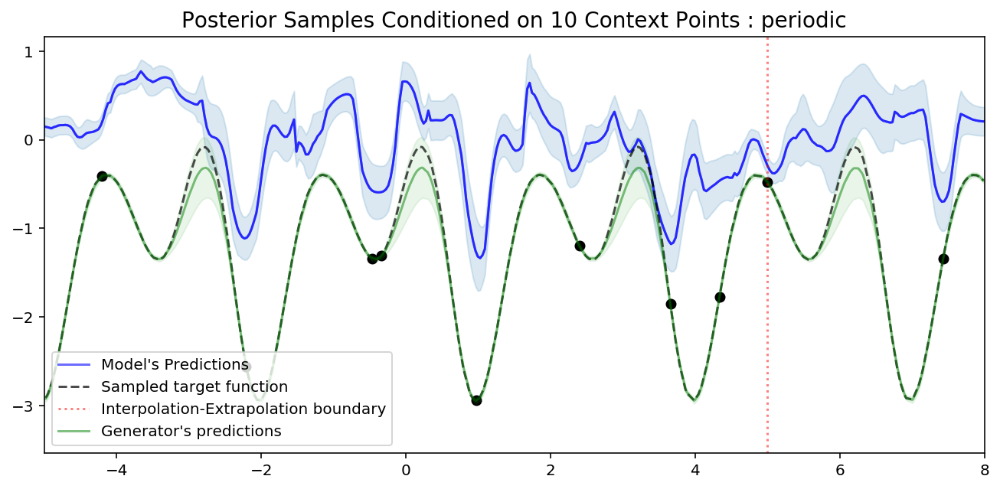

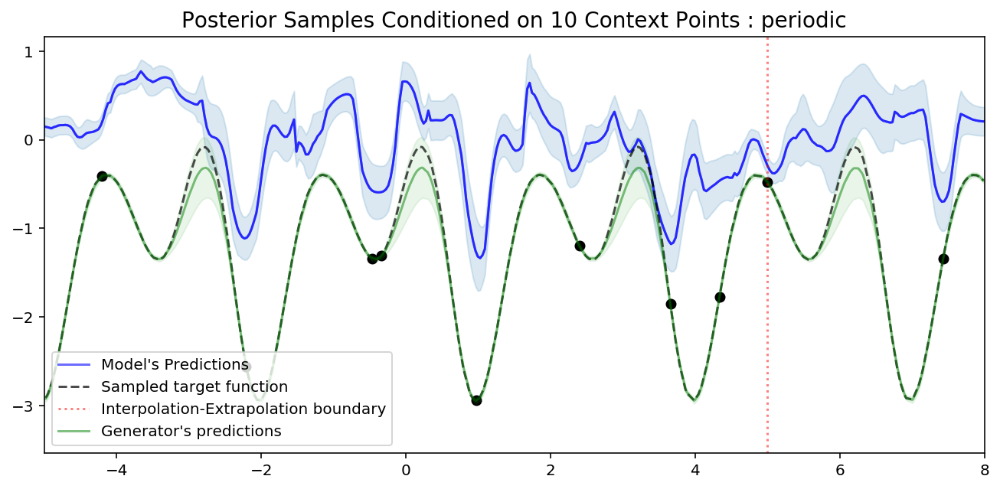

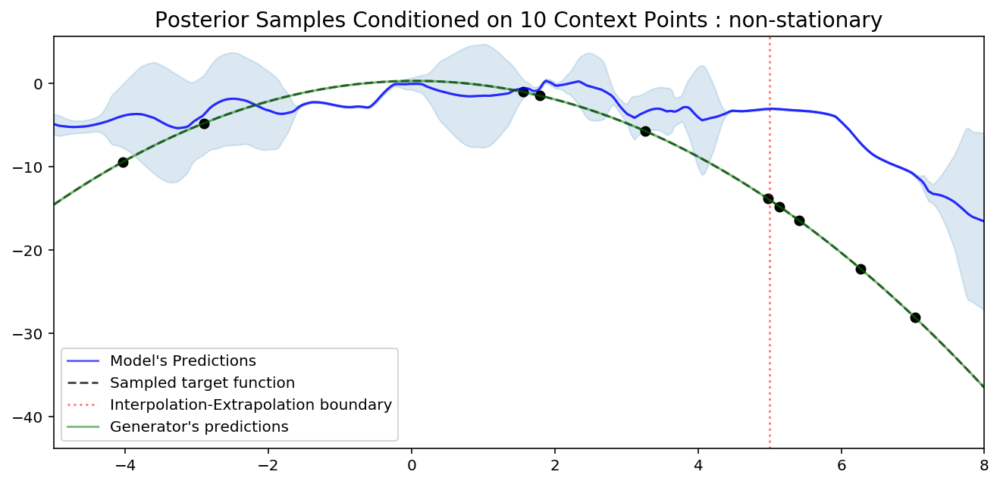

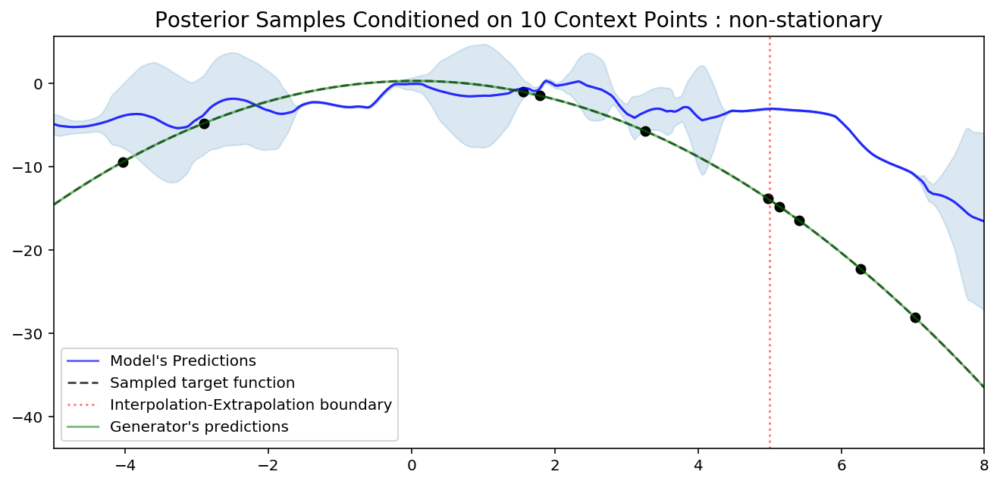

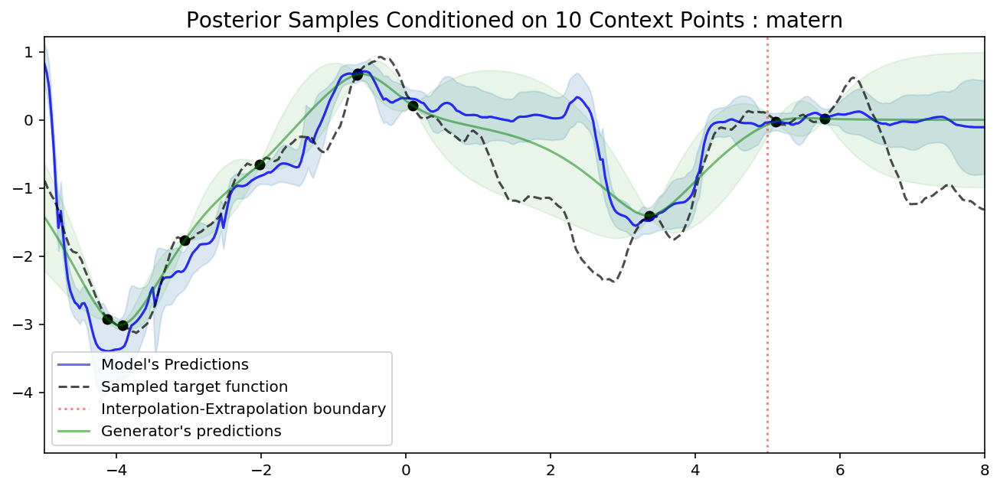

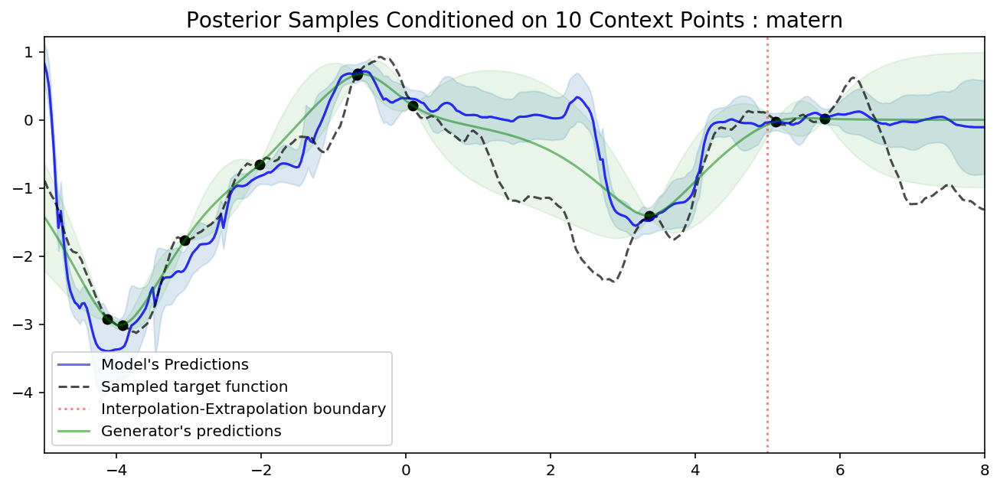

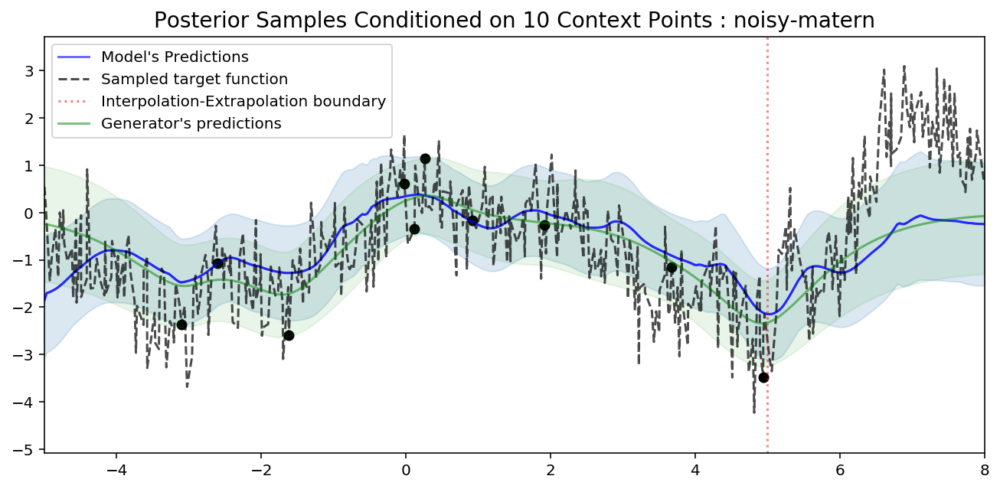

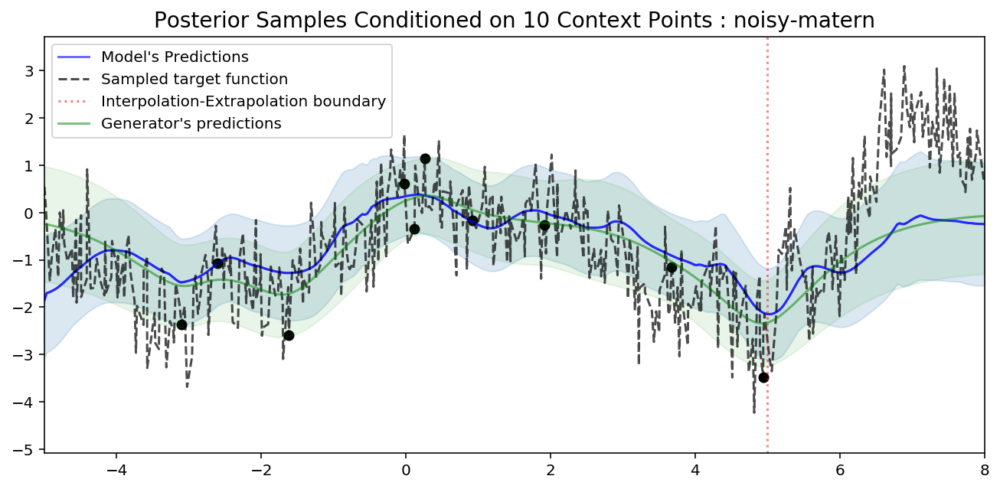

In [37]:
N_CNTXT = 10
for k,(neural_proc, dataset) in data_models.items():
    plot_posterior_samples(dataset, neural_proc, 
                           n_cntxt=N_CNTXT, 
                           test_min_max=EXTRAPOLATION_RANGE, 
                           n_points=400,
                           n_samples=2,
                           title="Posterior Samples Conditioned on {} Context Points : {}".format(N_CNTXT, k))

std: 0.8961056470870972
std: 0.21754682064056396
std: 0.8961056470870972
std: 0.21754682064056396
std: 0.42224323749542236
std: 0.3496481478214264
std: 0.42224323749542236
std: 0.3496481478214264
std: 1.1218485832214355
std: 1.1218485832214355


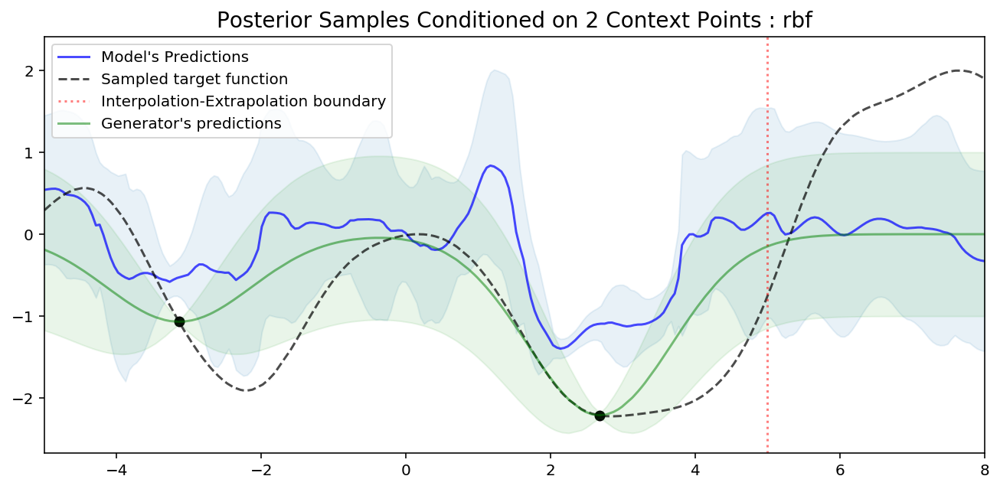

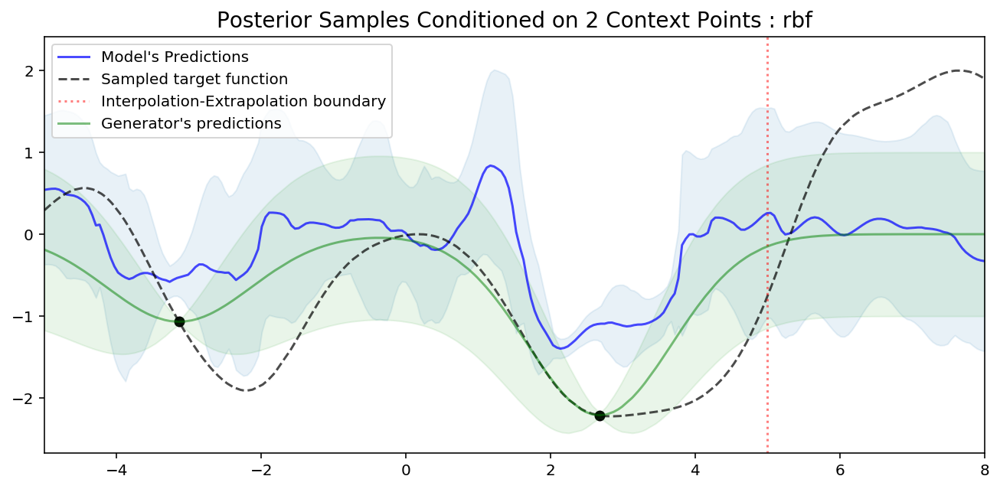

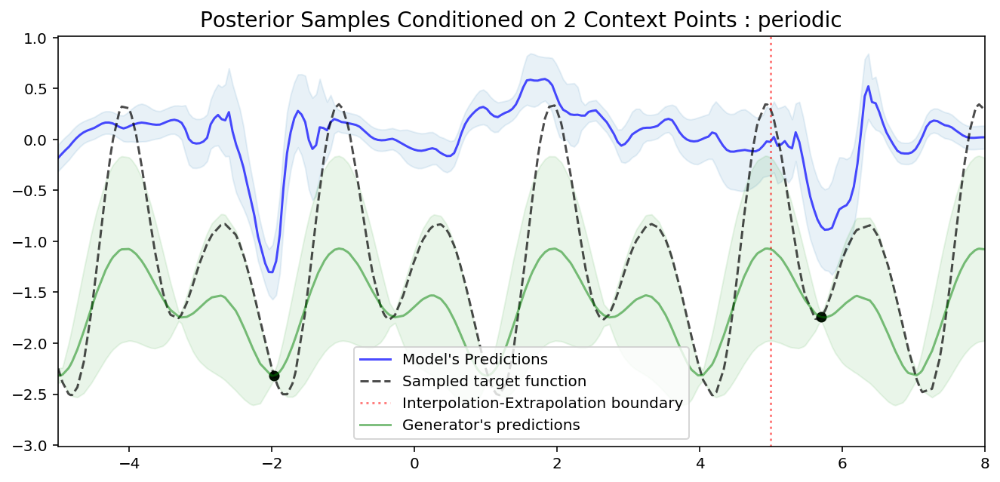

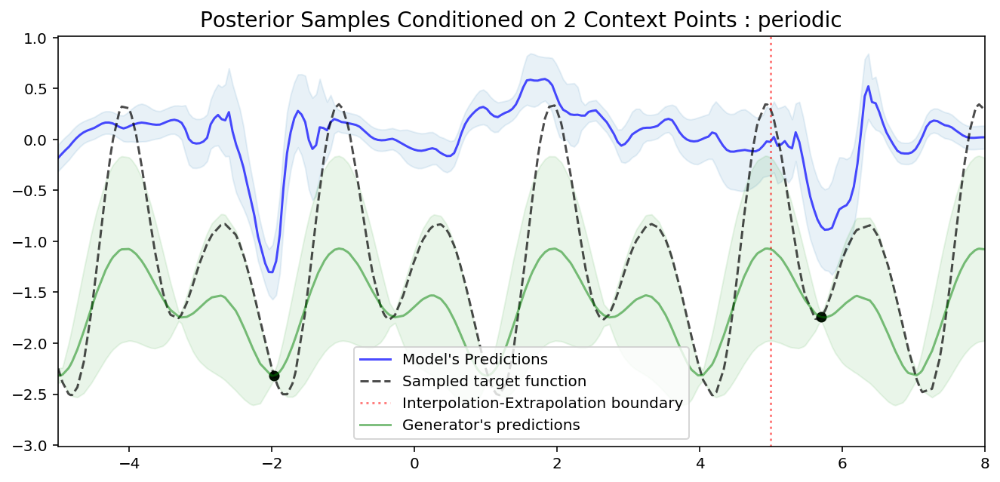

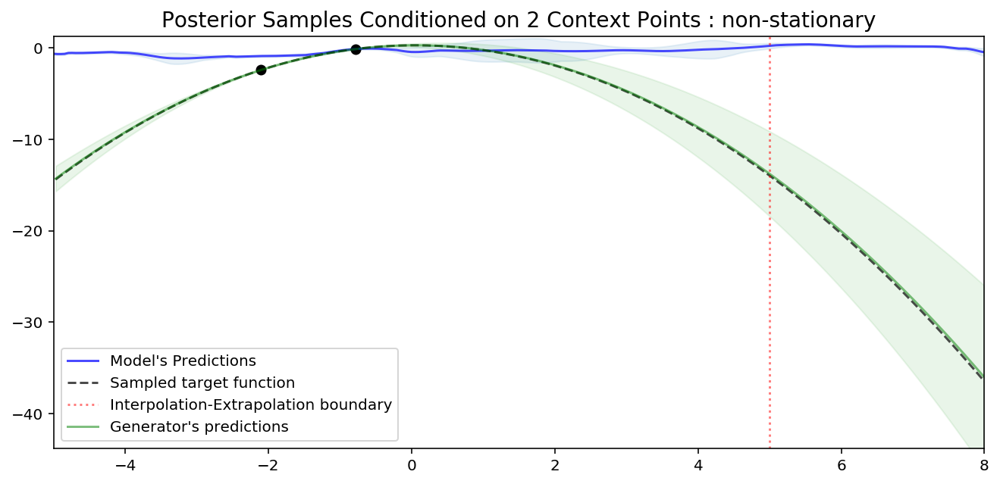

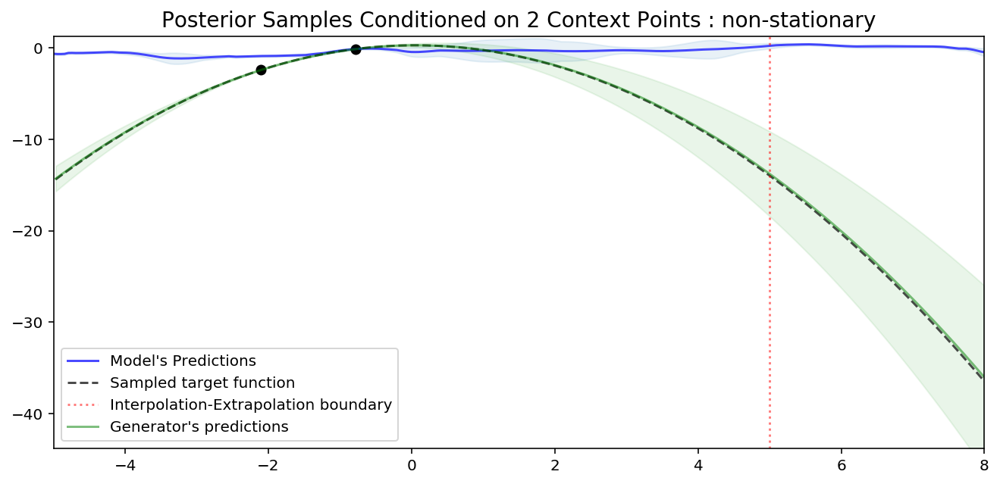

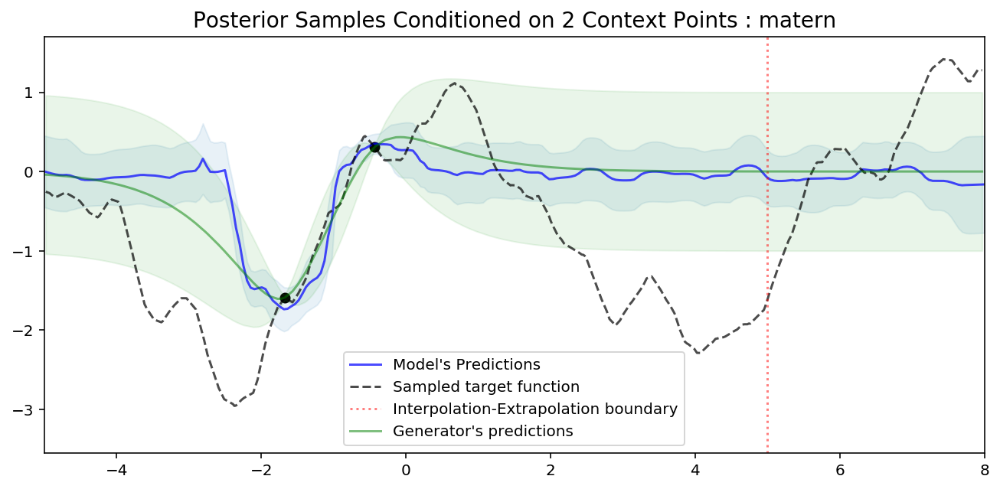

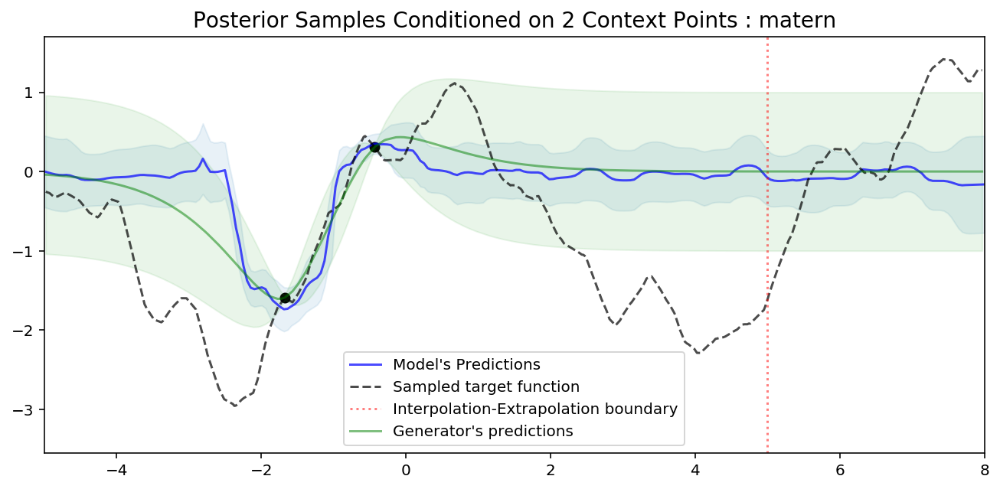

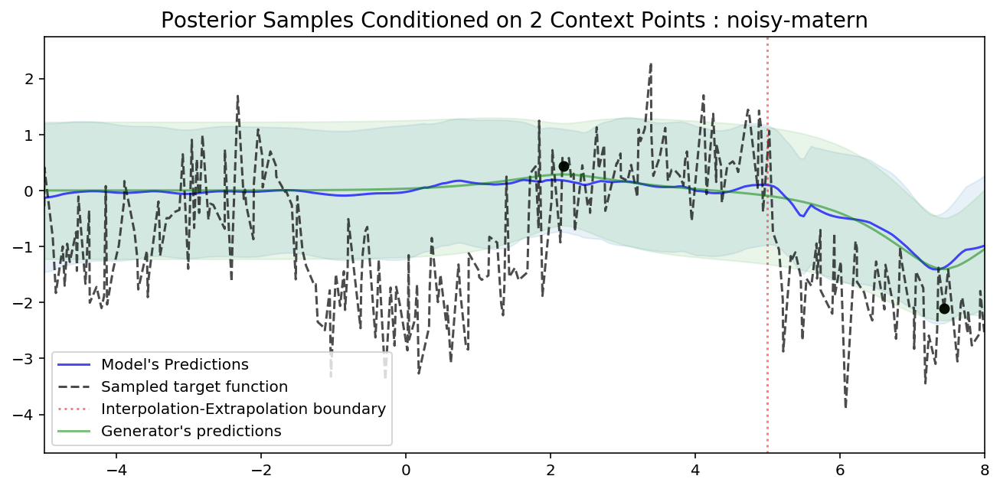

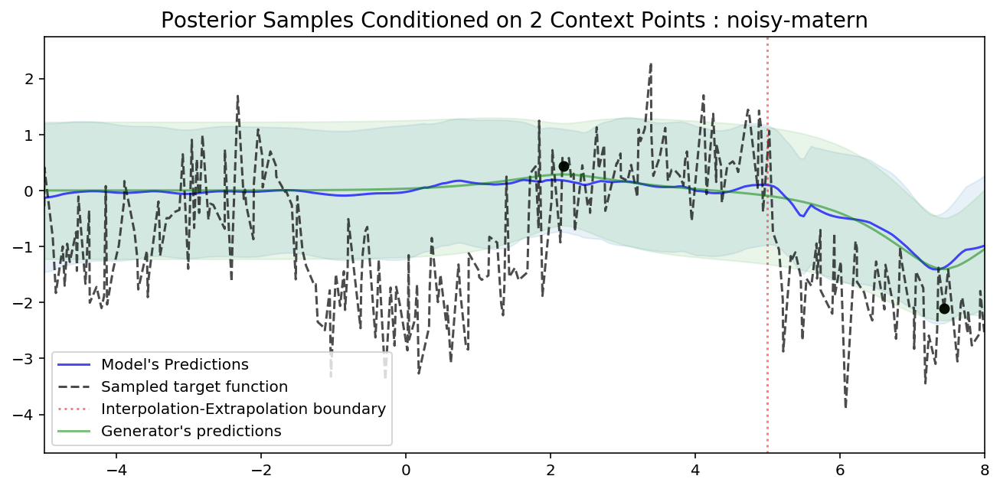

In [39]:
N_CNTXT = 2
for k,(neural_proc, dataset) in data_models.items():
    plot_posterior_samples(dataset, neural_proc, 
                           n_cntxt=N_CNTXT, 
                           test_min_max=EXTRAPOLATION_RANGE, 
                           n_points=2*N_POINTS,
                           n_samples=1,
                           title="Posterior Samples Conditioned on {} Context Points : {}".format(N_CNTXT, k))

std: 0.42202162742614746
std: 0.26537469029426575
std: 0.42202162742614746
std: 0.26537469029426575
std: 2.1099443435668945
std: 0.27776095271110535
std: 2.1099443435668945
std: 0.27776095271110535
std: 0.884158194065094
std: 0.884158194065094


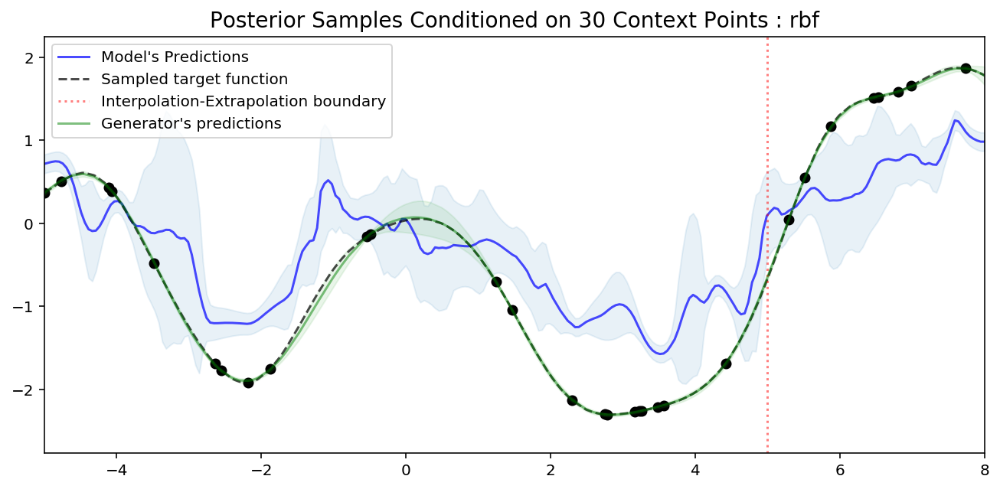

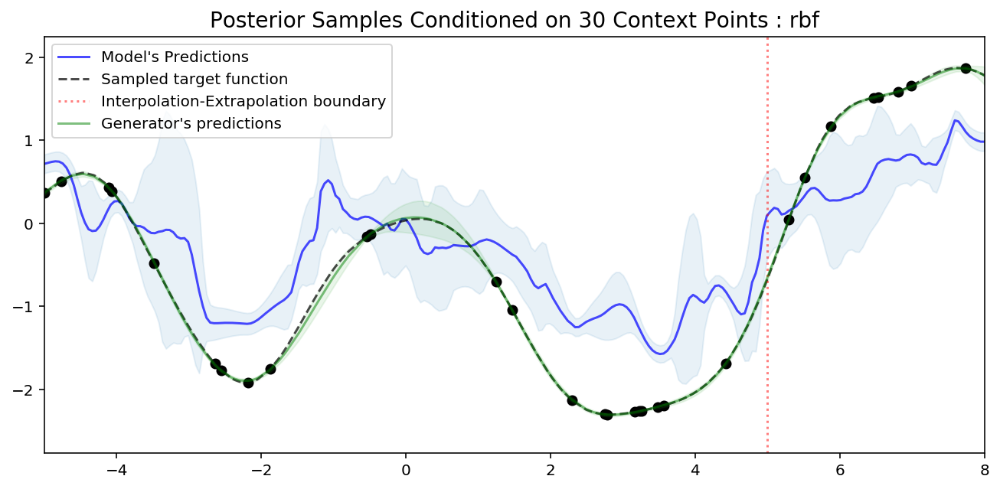

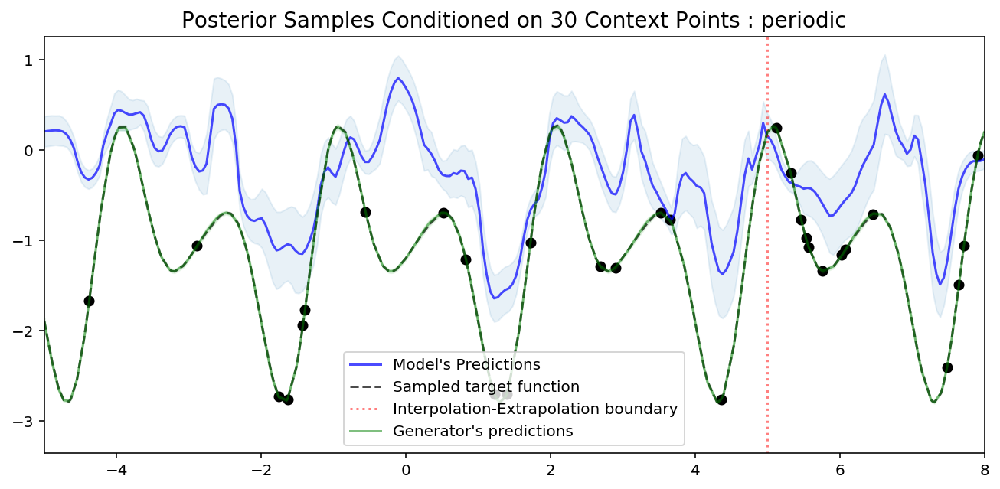

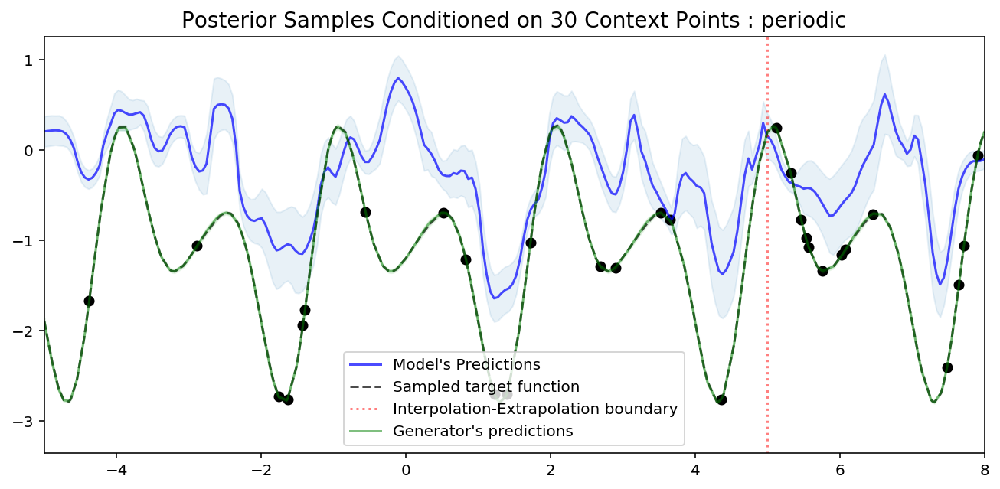

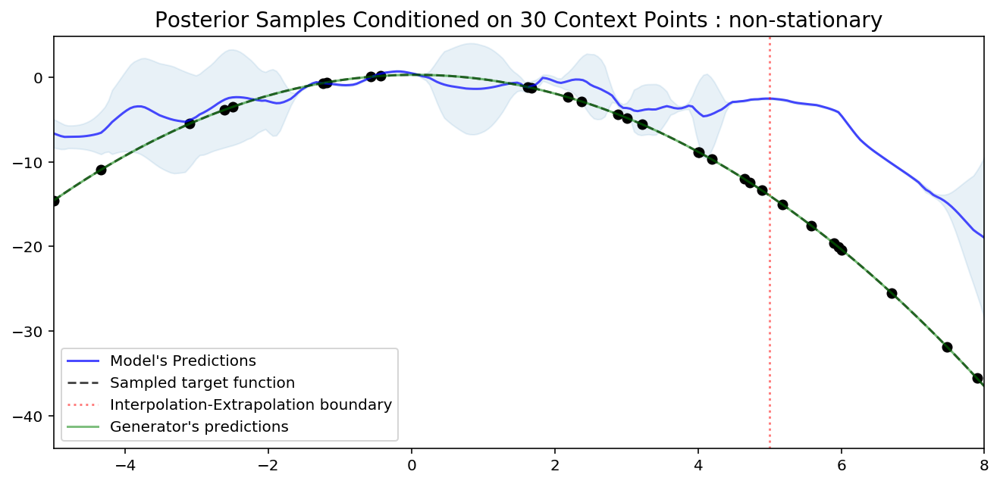

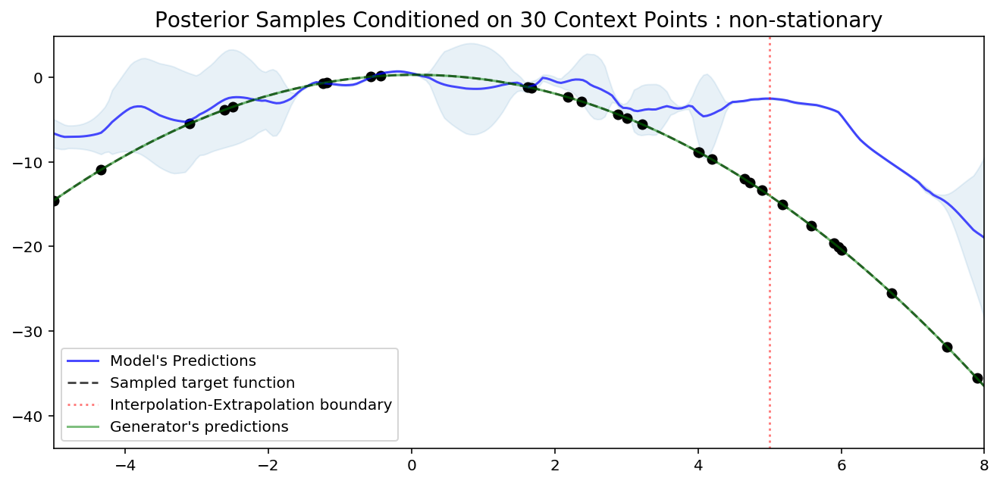

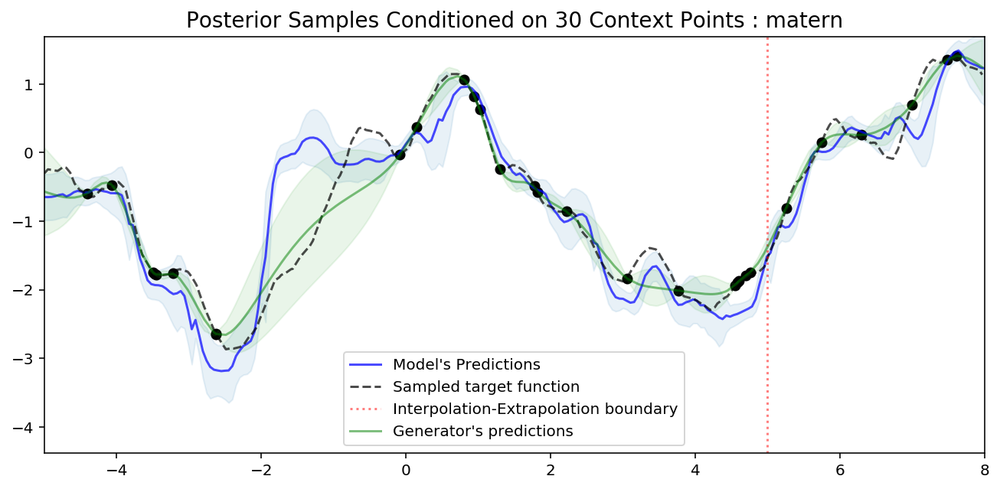

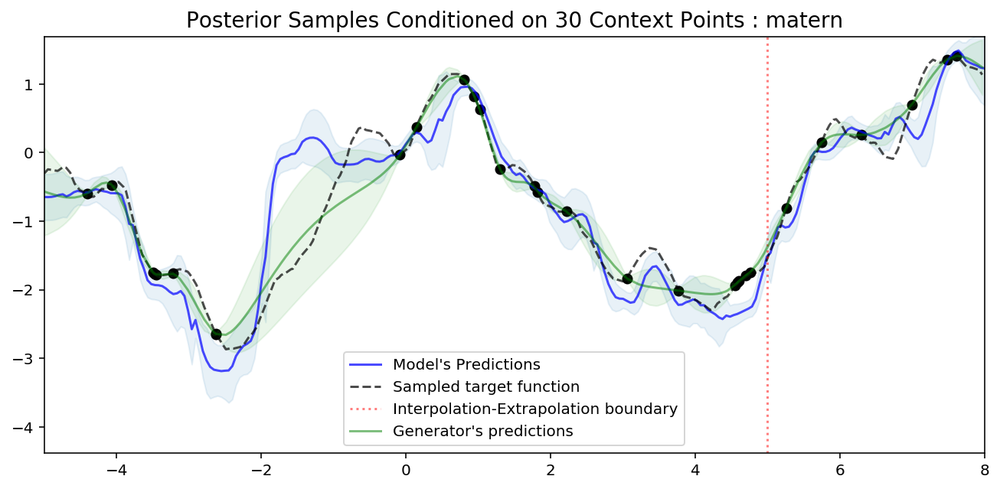

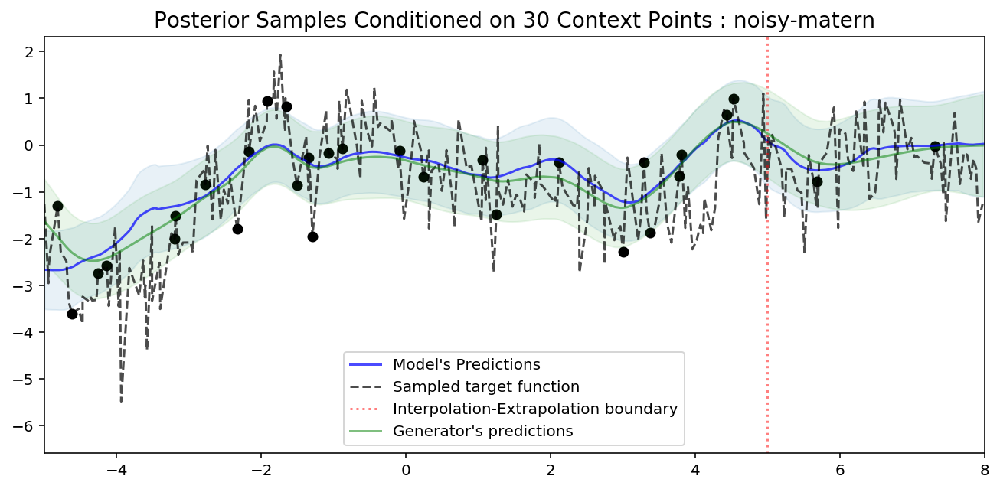

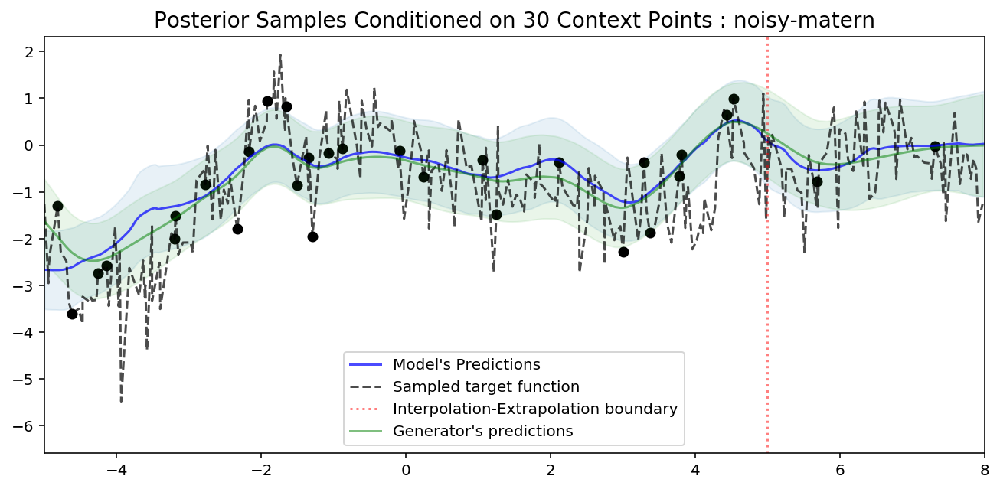

In [42]:
N_CNTXT = 30
for k,(neural_proc, dataset) in data_models.items():
    plot_posterior_samples(dataset, neural_proc, 
                           n_cntxt=N_CNTXT, 
                           test_min_max=EXTRAPOLATION_RANGE, 
                           n_points=2*N_POINTS,
                           n_samples=1,
                           title="Posterior Samples Conditioned on {} Context Points : {}".format(N_CNTXT, k))

std: 1.0974451303482056
std: 0.19135767221450806
std: 1.0974451303482056
std: 0.19135767221450806
std: 0.4922838509082794
std: 0.3501129150390625
std: 0.4922838509082794
std: 0.3501129150390625
std: 1.1446857452392578
std: 1.1446857452392578


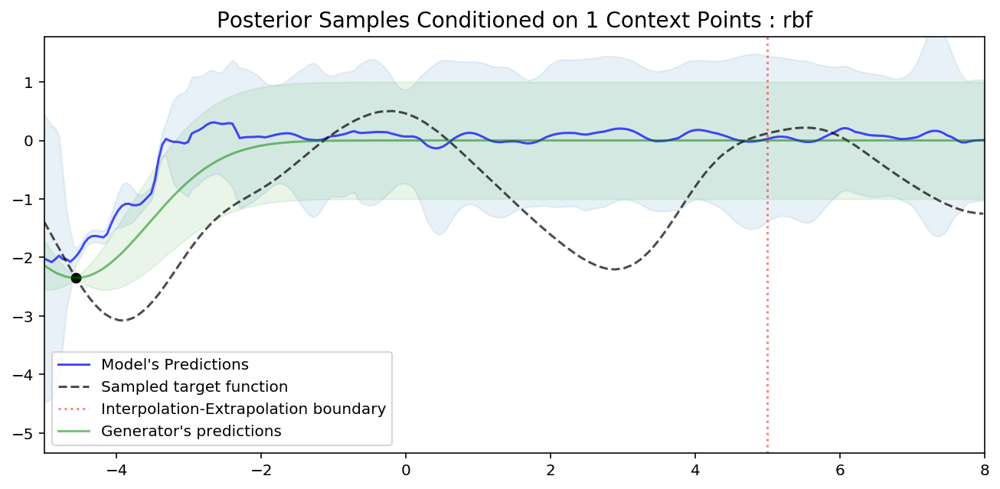

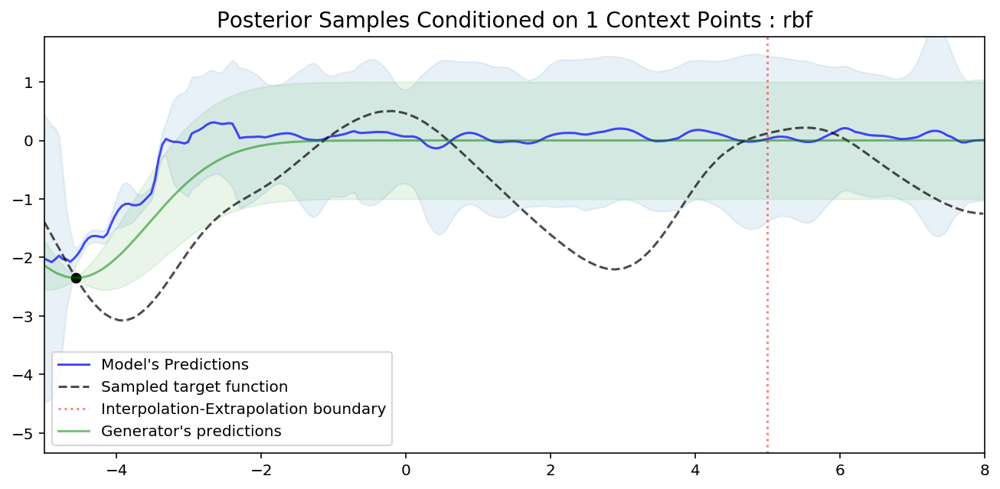

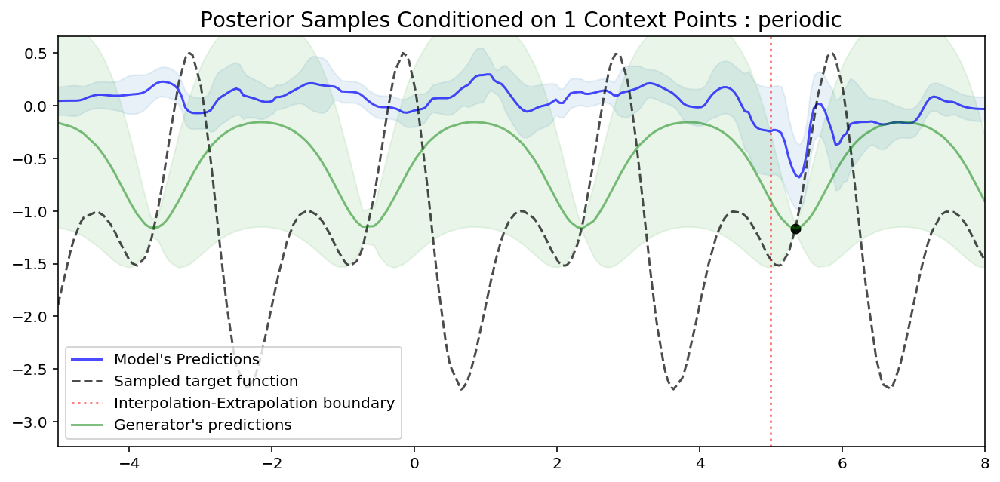

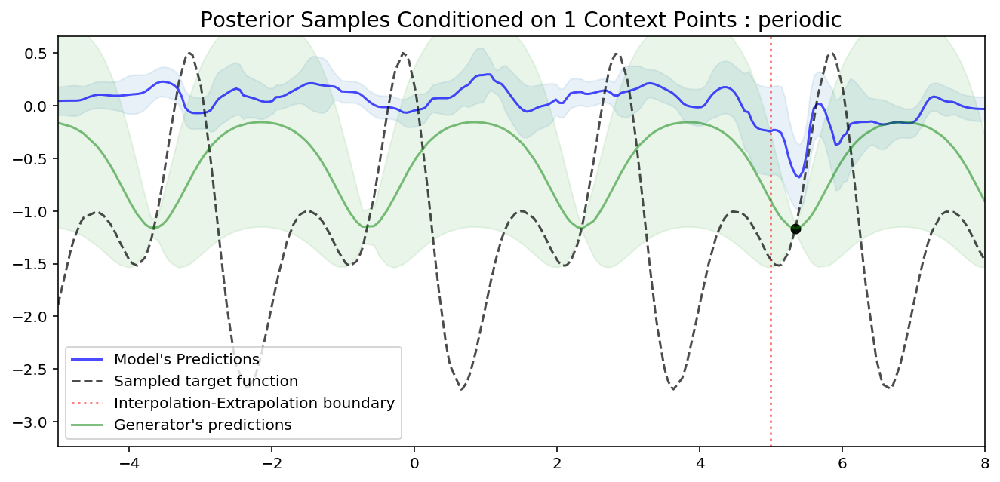

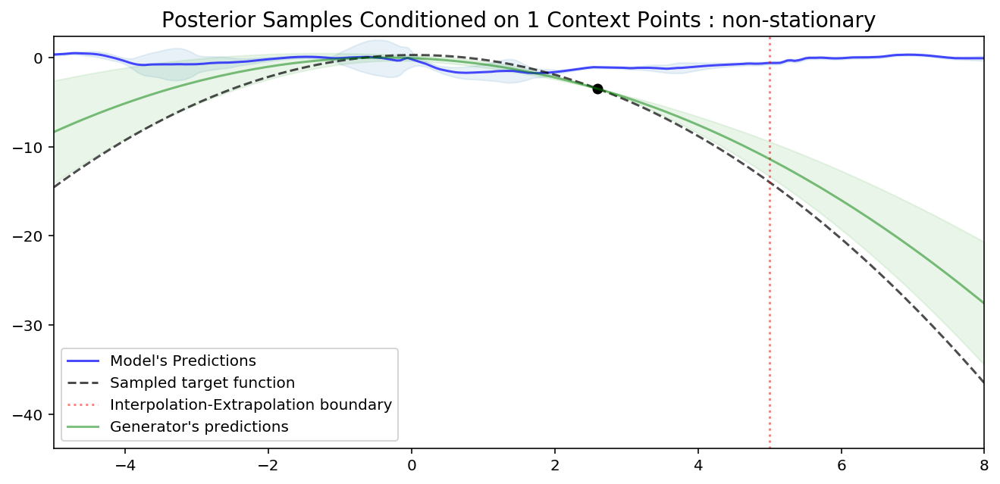

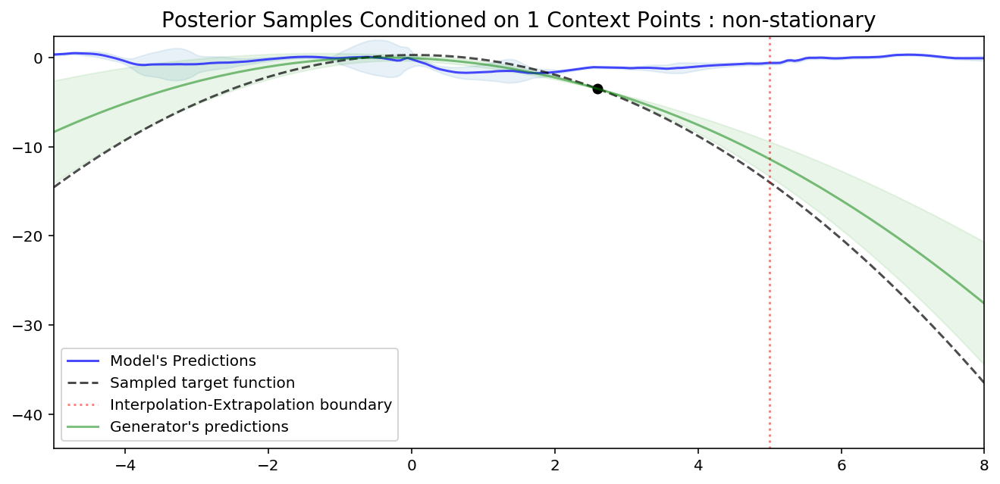

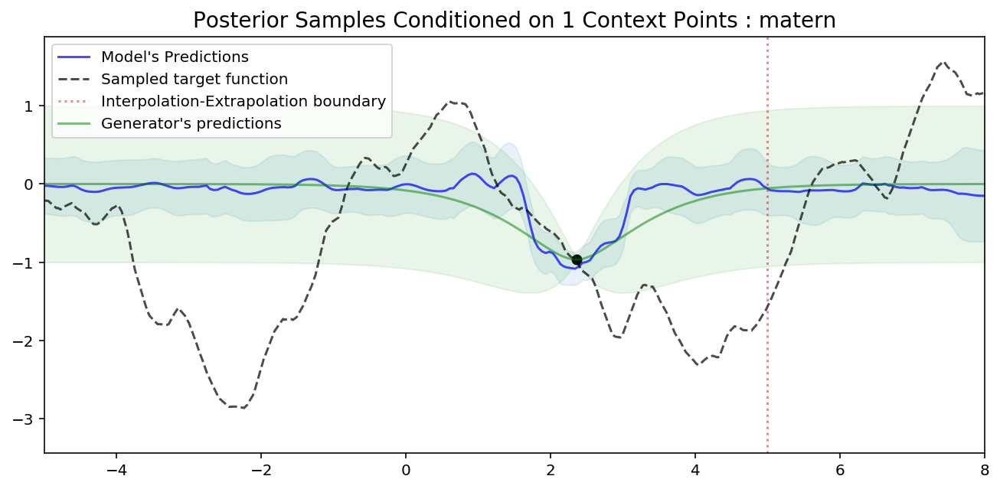

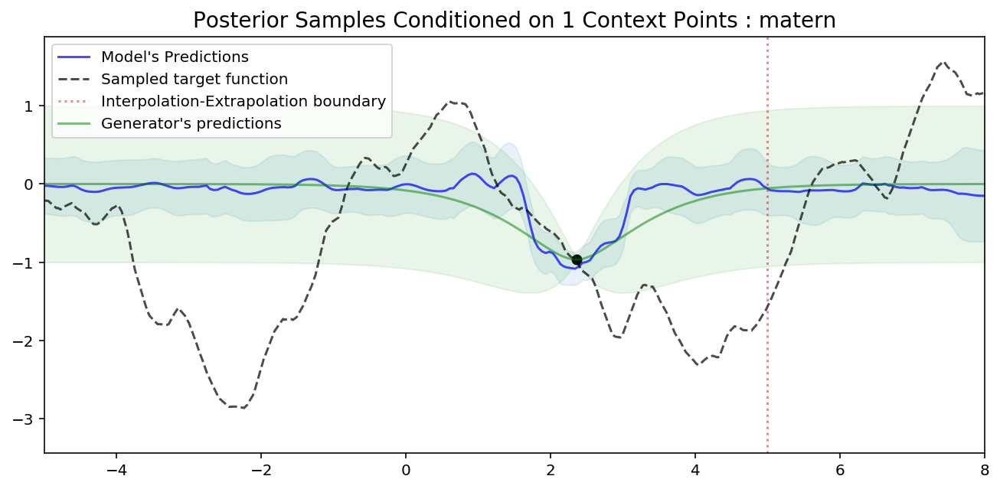

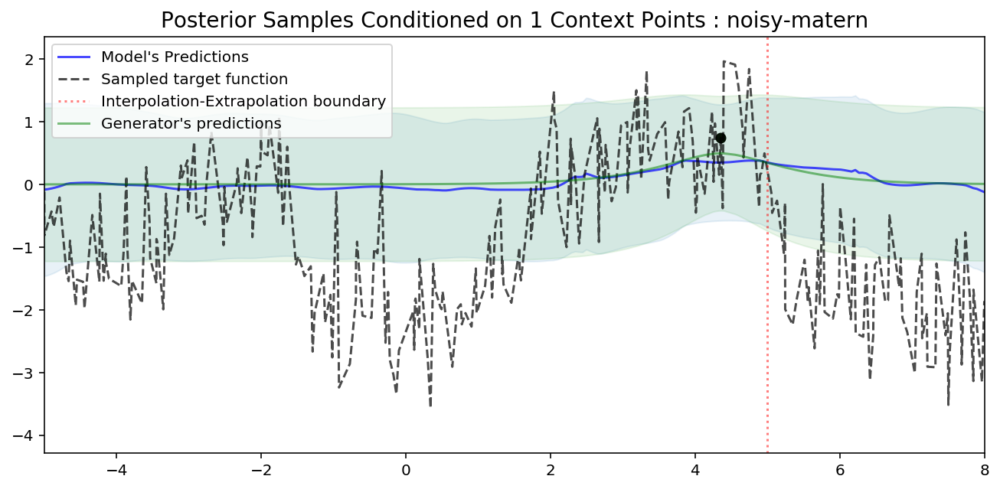

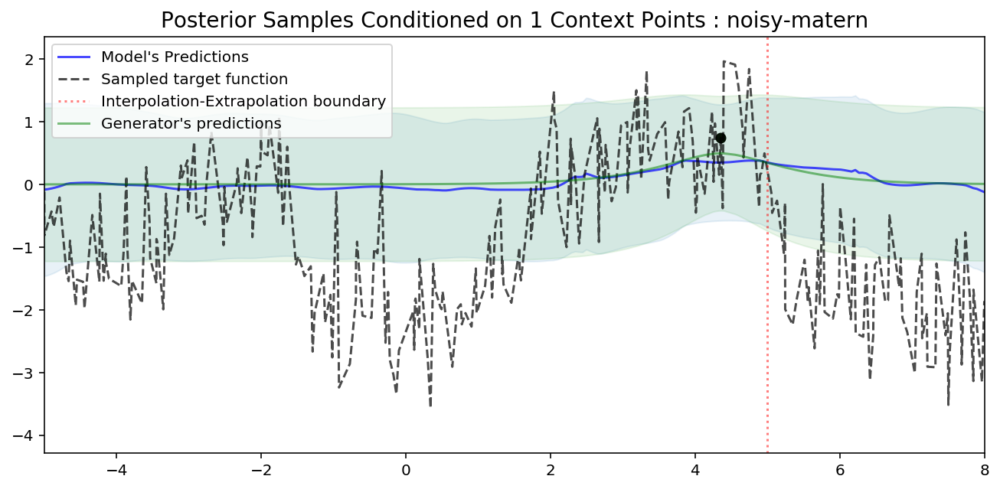

In [41]:
N_CNTXT = 1
for k,(neural_proc, dataset) in data_models.items():
    plot_posterior_samples(dataset, neural_proc, 
                           n_cntxt=N_CNTXT, 
                           test_min_max=EXTRAPOLATION_RANGE, 
                           n_points=2*N_POINTS,
                           n_samples=1,
                           title="Posterior Samples Conditioned on {} Context Points : {}".format(N_CNTXT, k))

We see that the predictions are much better than in [Tutorial 2 - Neural Process]

**Good**:
- the sampled function all go through or close to the context points
- the uncertainty decreases close to context points
- the samples all seem relatively different (not linear shifts like in [Tutorial 2 - Neural Process])

**Bad**:
- there seems to always be a strange "jump" in the middle of region between 2 far points. This is probably due to the softmax in cross attention, and disappears when using multihead attention. 
- cannot extrapolate and not even give high uncertainty when extrapolating

[Tutorial 2 - Neural Process]: Tutorial%202%20-%20Neural%20Process.ipynb

In [30]:
def get_cntxt_trgt(*args):
    return context_target_split(*args, 
                                range_cntxts=RANGE_CNTXT, 
                                range_trgts=RANGE_TRGTS, 
                                is_add_cntxts_to_trgts=False,
                                is_all_trgts=True) # don't add all cntxt to target for CNN Neural Process


def init_model(**kwargs):
    return AttentiveNeuralProcess(X_DIM, Y_DIM,
                         XEncoder=nn.Identity,
                         XYEncoder=lambda *args: ReturnInput(2),  # return y 
                         Decoder=lambda *args: ReturnInput(2),  # return y 
                         PredictiveDistribution=Normal, 
                          get_cntxt_trgt=get_cntxt_trgt,
                          attention="generalized_conv", # parameter free attention because simple task
                          encoded_path="deterministic", # use both latent  and deterministic path as in paper
                          n_conv=3,
                          is_concat=True,
                          kernel_size=7,
                          is_normalize=True,
                          is_batchnorm=False,
                          dilation=1,
                          is_depth_separable_conv=True,
                          is_u_style=False,
                                  n_tmp_queries=512,
                         **kwargs) # don't normalize

In [31]:
# initialize one model for each dataset
data_models2 = {name: [init_model(), data]
               for name, data in datasets.items()}

In [32]:
for k, (neural_proc, dataset) in data_models2.items():
    print("N Param:", count_parameters(neural_proc))
    break

N Param: 4709


In [33]:
N_SAMPLES = 50000

In [38]:
for k,(neural_proc, dataset) in data_models2.items():
    
    
    print()
    print("--- {} {} ---".format("Training" if is_RETRAIN else "Loading", k))
    print()
    
    
    model = NeuralNetTransformer(neural_proc, 
                                 lambda *args: NeuralProcessLoss(*args, is_mean=True),
                                 max_epochs=N_EPOCHS,
                                 batch_size=BATCH_SIZE,
                                 train_split=None,  # don't use cross validation dev set
                                 lr=1e-3, # they use 5e-5 because 16 batch size but that would be slow
                                 callbacks=[ProgressBar()], # checkpoint best model
                                ) 
    
    if is_RETRAIN:
        _=model.fit(*make_Xy_input(dataset))


--- Training rbf ---



  epoch    train_loss     dur
-------  ------------  ------
      1        0.1620  8.1771


      2        0.1229  8.1016


      3        0.0381  8.2083


      4        0.0920  8.2648


      5       -0.0450  8.2511


      6       -0.1178  8.0112


      7       -0.0988  8.1033


      8       -0.1592  8.1049


      9       -0.2071  8.5777


     10       -0.2723  8.2684


     11       -0.2171  8.3382


     12       -0.3429  8.4486


     13       -0.3356  8.1163


     14       -0.3647  8.4037


     15       -0.4080  8.4847


     16       -0.4368  8.4665


     17       -0.3461  8.6796


     18       -0.4764  8.4207


     19       -0.4288  8.4717


     20       -0.5078  8.4122


     21       -0.5136  8.5872


     22       -0.4894  8.6608


     23       -0.4994  8.6488


     24       -0.5509  8.4742


     25       -0.5394  8.5250


     26       -0.5656  8.7627


     27       -0.5321  8.5034


     28       -0.5504  8.6758


     29       -0.6106  8.4661


     30       -0.6083  8.4154


     31       -0.4914  8.4521


     32       -0.5939  8.5538


     33       -0.6427  8.5864


     34       -0.5266  8.5502


     35       -0.5531  8.6299


     36       -0.6538  8.5610


     37       -0.6548  8.1259


     38       -0.6093  8.3147


     39       -0.6174  8.6632


     40       -0.5795  8.4816


     41       -0.6811  8.2720


     42       -0.6793  8.3740


     43       -0.6790  8.5288


     44       -0.6454  8.7429


     45       -0.6689  8.1745


     46       -0.6472  8.4117


     47       -0.5927  8.6700


     48       -0.6361  8.2658


     49       -0.6328  8.1719


     50       -0.6824  8.4122

--- Training periodic ---



  epoch    train_loss     dur
-------  ------------  ------
      1        1.1958  8.9928


      2        1.0880  8.5681


      3        0.9678  8.6094


      4        0.8251  8.6140


      5        0.7129  8.5617


      6        0.6260  8.5000


      7        0.6159  8.4218


      8        0.5977  8.3656


      9        0.5726  8.5322


     10        0.5438  8.2727


     11        0.5535  8.7814


     12        0.5255  8.5813


     13        0.5022  8.6357


     14        0.4575  8.2284


     15        0.4244  8.3737


     16        0.4010  8.4533


     17        0.4064  8.6541


     18        0.3141  8.3384


     19        0.3088  8.5637


     20        0.2292  8.3663


     21        0.2522  8.5283


     22        0.2057  8.5266


     23        0.1996  8.4408


     24        0.1375  8.5265


     25        0.1793  8.6213


     26        0.0868  8.4222


     27        0.0871  8.4007


     28        0.0608  8.5920


     29        0.0391  8.4031


     30        0.0029  8.4429


     31        0.0379  8.6533


     32       -0.0020  8.4741


     33       -0.0190  8.5407


     34        0.0130  8.7821


     35        0.0538  8.5481


     36       -0.1068  8.5585


     37       -0.0983  8.2451


     38       -0.0743  8.6192


     39       -0.0725  8.2801


     40       -0.0607  8.7339


     41       -0.1095  8.5195


     42       -0.1456  8.4692


     43       -0.1163  8.2971


     44       -0.0995  8.2237


     45       -0.1024  8.6422


     46       -0.1079  8.5181


     47       -0.1111  8.3886


     48       -0.1061  8.4631


     49       -0.2003  8.5715



--- Training non-stationary ---




--- Training matern ---




--- Training noisy-matern ---



std: 0.4450032711029053
std: 0.5061980485916138
std: 0.7598591446876526
std: 0.40353095531463623
std: 1.2036548852920532


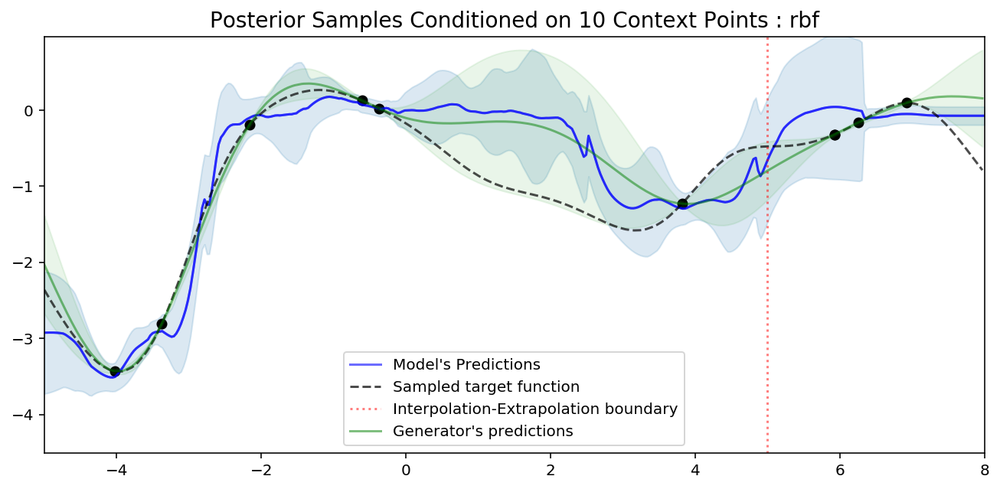

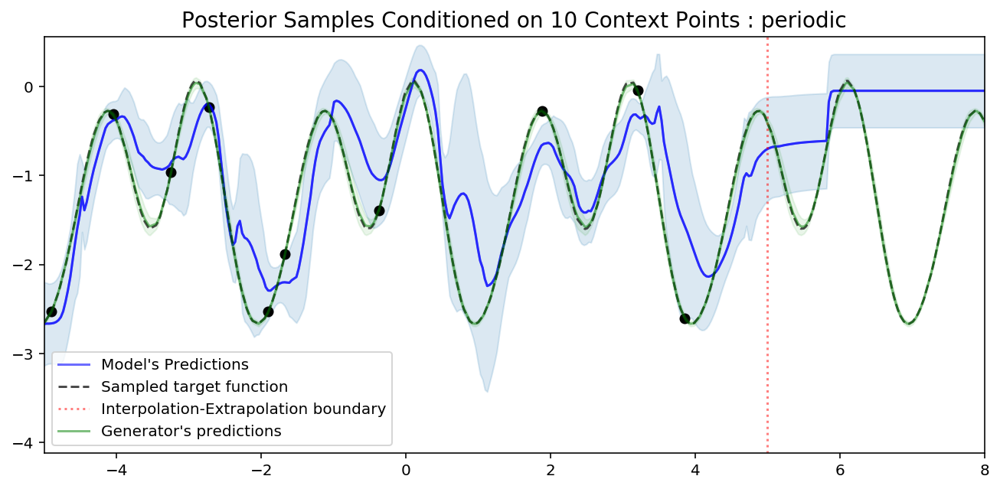

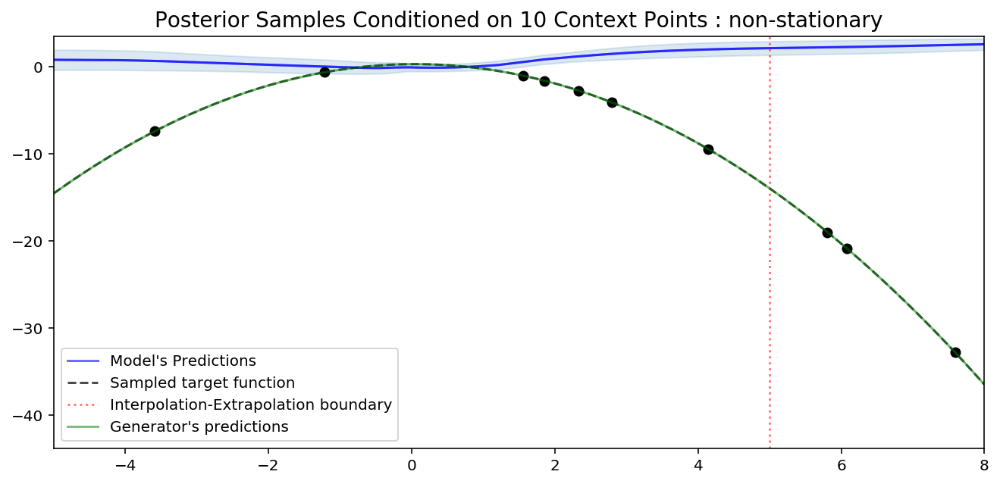

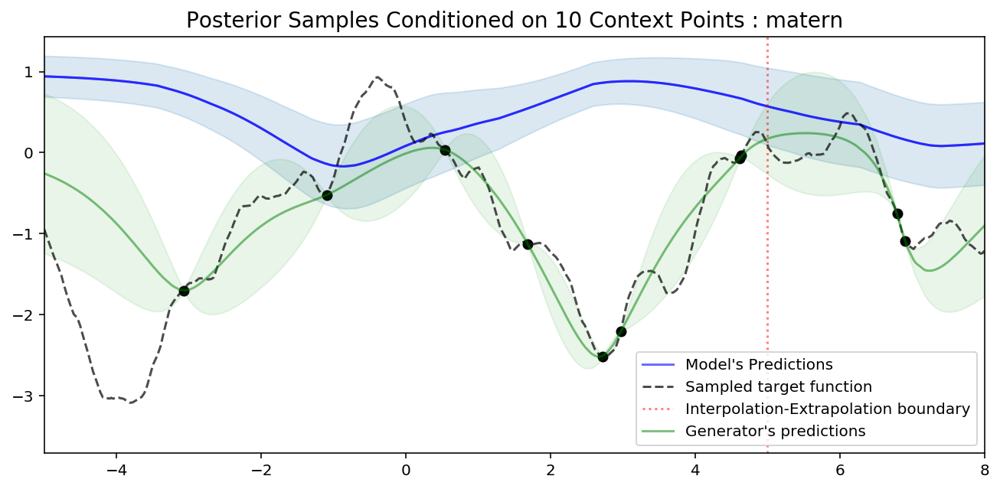

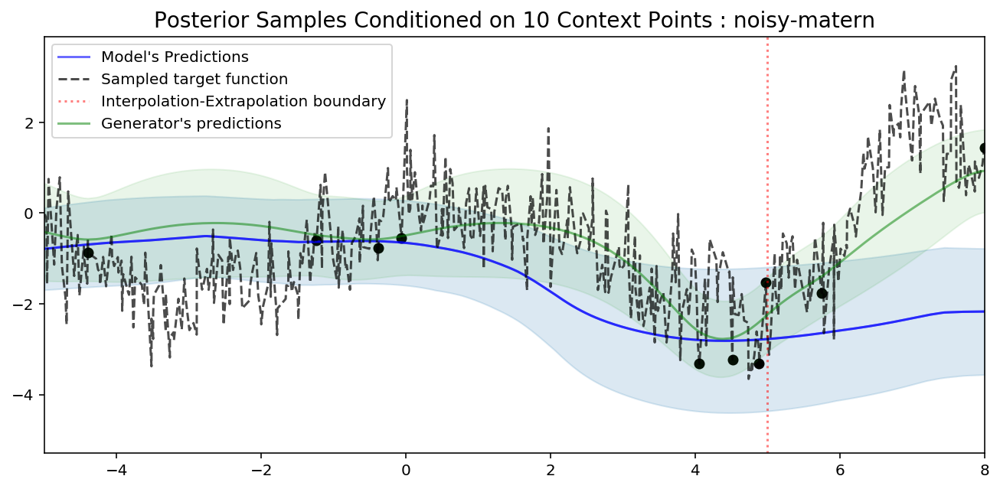

In [40]:
N_CNTXT = 10
for k,(neural_proc, dataset) in data_models2.items():
    plot_posterior_samples(dataset, neural_proc, 
                           n_cntxt=N_CNTXT, 
                           test_min_max=EXTRAPOLATION_RANGE, 
                           n_points=400,
                           n_samples=2,
                           title="Posterior Samples Conditioned on {} Context Points : {}".format(N_CNTXT, k))

In [ ]:
N_CNTXT = 20
for k,(neural_proc, dataset) in data_models2.items():
    plot_posterior_samples(dataset, neural_proc, 
                           n_cntxt=N_CNTXT, 
                           test_min_max=EXTRAPOLATION_RANGE, 
                           n_points=2*N_POINTS,
                           n_samples=1,
                           title="Posterior Samples Conditioned on {} Context Points : {}".format(N_CNTXT, k))

In [ ]:
N_CNTXT = 2
for k,(neural_proc, dataset) in data_models2.items():
    plot_posterior_samples(dataset, neural_proc, 
                           n_cntxt=N_CNTXT, 
                           test_min_max=EXTRAPOLATION_RANGE, 
                           n_points=2*N_POINTS,
                           n_samples=1,
                           title="Posterior Samples Conditioned on {} Context Points : {}".format(N_CNTXT, k))

In [90]:
from skssl.utils.helpers import rescale_range
for k,(neural_proc, dataset) in data_models.items():
    extrap_rescaled_range = tuple(rescale_range(np.array(EXTRAPOLATION_RANGE), (-5,5), (-1,1)))
    #neural_proc.attender.extend_tmp_queries(extrap_rescaled_range)
    neural_proc.attender.tmp_queries = extend_tmp_queries(torch.linspace(-1,1,512), extrap_rescaled_range)

tensor(1.) 1.6 tensor(0.0039)
tensor(1.) 1.6 tensor(0.0039)
tensor(1.) 1.6 tensor(0.0039)
tensor(1.) 1.6 tensor(0.0039)
tensor(1.) 1.6 tensor(0.0039)


In [82]:
def extend_tmp_queries(tmp_queries, min_max):
    """
    Scale the temporary queries to be in a given range while keeping
    the same density than during training (used for extrapolation.).
    """
    current_min = min(tmp_queries)
    current_max = max(tmp_queries)
    delta = tmp_queries[1] - tmp_queries[0] 
    n_queries_per_increment = len(tmp_queries) / (current_max - current_min)
    n_add_left = math.ceil((current_min - min_max[0]) * n_queries_per_increment)
    n_add_right = math.ceil((min_max[1] - current_max) * n_queries_per_increment)

    tmp_queries_l = []
    if n_add_left > 0:
        tmp_queries_l.append(torch.arange(min_max[0], current_min, delta))
    tmp_queries_l.append(tmp_queries)
    print(current_max, min_max[1], delta)
    if n_add_right > 0:
        # add delta to not have twice the previous max boundary
        tmp_queries_l.append(torch.arange(current_max, min_max[1], delta) + delta)
    return torch.cat(tmp_queries_l)

In [94]:
a=torch.tensor(1.)

In [95]:
a.to("cuda")

tensor(1., device='cuda:0')

In [96]:
a

tensor(1.)

In [84]:
tmp_queries = extend_tmp_queries(torch.linspace(-1,1,512), extrap_rescaled_range)

tensor(1.) 1.6 tensor(0.0039)


In [87]:
tmp_queries

tensor([-1.0000, -0.9961, -0.9922, -0.9883, -0.9843, -0.9804, -0.9765, -0.9726,
        -0.9687, -0.9648, -0.9609, -0.9569, -0.9530, -0.9491, -0.9452, -0.9413,
        -0.9374, -0.9335, -0.9295, -0.9256, -0.9217, -0.9178, -0.9139, -0.9100,
        -0.9061, -0.9022, -0.8982, -0.8943, -0.8904, -0.8865, -0.8826, -0.8787,
        -0.8748, -0.8708, -0.8669, -0.8630, -0.8591, -0.8552, -0.8513, -0.8474,
        -0.8434, -0.8395, -0.8356, -0.8317, -0.8278, -0.8239, -0.8200, -0.8160,
        -0.8121, -0.8082, -0.8043, -0.8004, -0.7965, -0.7926, -0.7886, -0.7847,
        -0.7808, -0.7769, -0.7730, -0.7691, -0.7652, -0.7613, -0.7573, -0.7534,
        -0.7495, -0.7456, -0.7417, -0.7378, -0.7339, -0.7299, -0.7260, -0.7221,
        -0.7182, -0.7143, -0.7104, -0.7065, -0.7025, -0.6986, -0.6947, -0.6908,
        -0.6869, -0.6830, -0.6791, -0.6751, -0.6712, -0.6673, -0.6634, -0.6595,
        -0.6556, -0.6517, -0.6477, -0.6438, -0.6399, -0.6360, -0.6321, -0.6282,
        -0.6243, -0.6204, -0.6164, -0.61

In [85]:
neural_proc.attender.tmp_queries[1]- neural_proc.attender.tmp_queries[0]

tensor(0.0039)

std: 0.42046821117401123
std: 0.5502831339836121
std: 0.6086108684539795
std: 0.37043270468711853
std: 1.0624512434005737


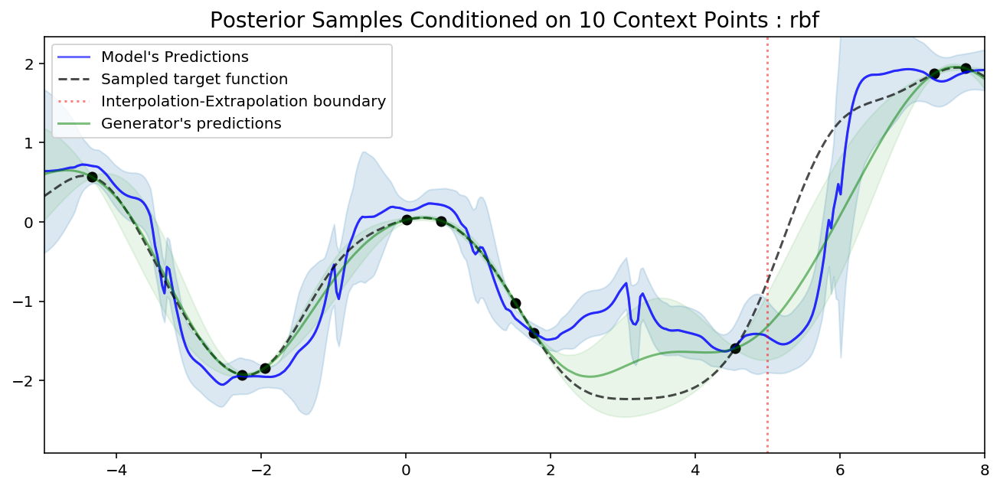

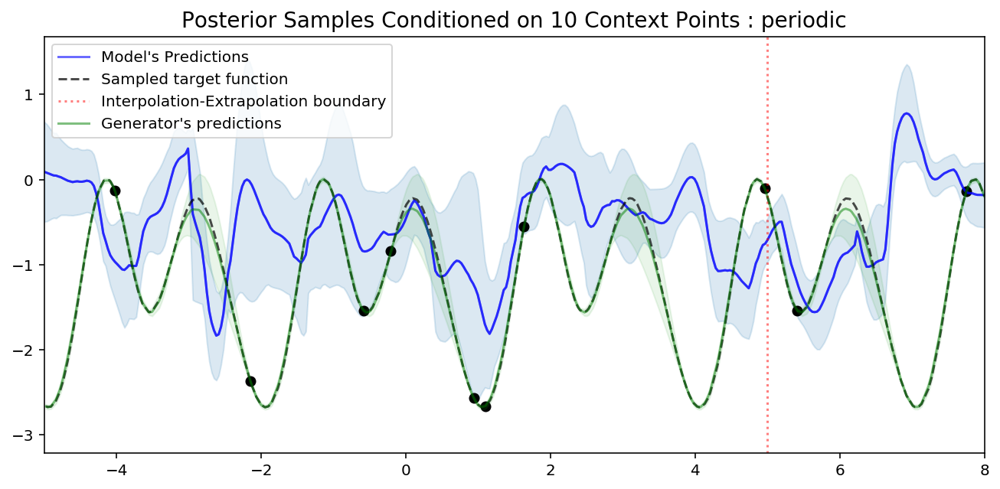

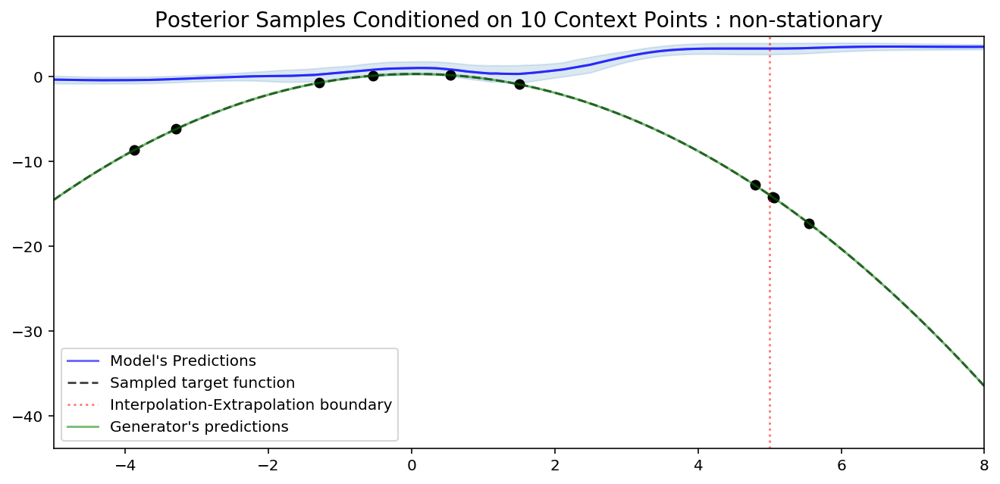

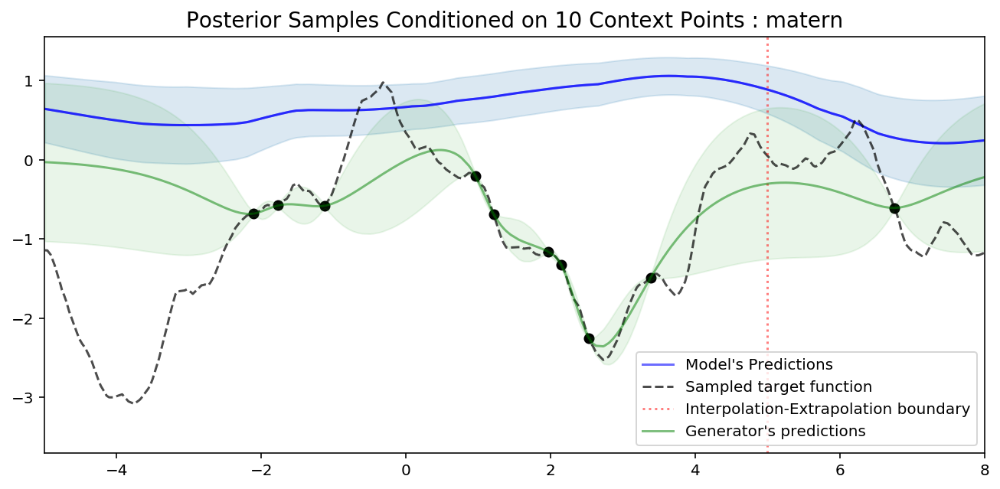

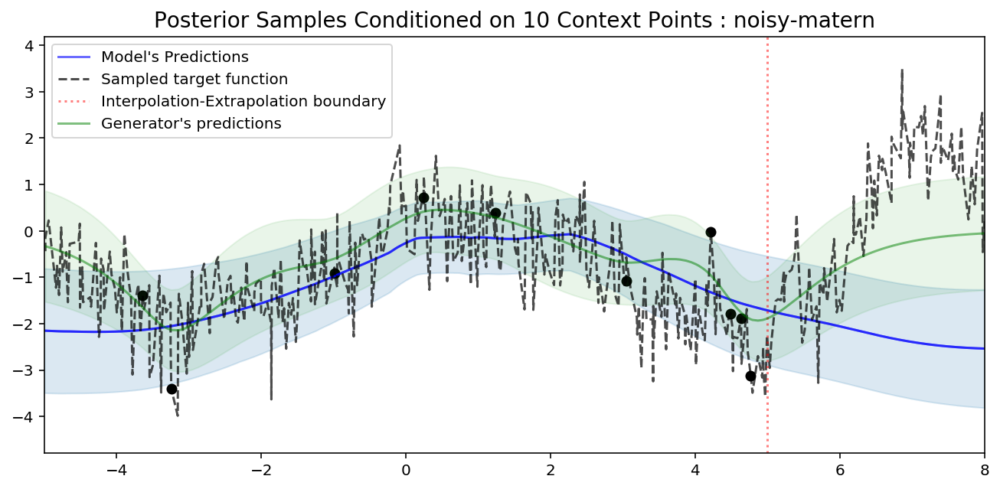

In [92]:
N_CNTXT = 10
for k,(neural_proc, dataset) in data_models2.items():
    plot_posterior_samples(dataset, neural_proc, 
                           n_cntxt=N_CNTXT, 
                           test_min_max=EXTRAPOLATION_RANGE, 
                           n_points=400,
                           n_samples=2,
                           title="Posterior Samples Conditioned on {} Context Points : {}".format(N_CNTXT, k))

In [44]:
len(neural_proc.attender.tmp_queries)

665

In [52]:
neural_proc.attender.tmp_queries = torch.linspace(-1,1,512)

In [53]:
neural_proc.attender.tmp_queries

tensor([-1.0000, -0.9961, -0.9922, -0.9883, -0.9843, -0.9804, -0.9765, -0.9726,
        -0.9687, -0.9648, -0.9609, -0.9569, -0.9530, -0.9491, -0.9452, -0.9413,
        -0.9374, -0.9335, -0.9295, -0.9256, -0.9217, -0.9178, -0.9139, -0.9100,
        -0.9061, -0.9022, -0.8982, -0.8943, -0.8904, -0.8865, -0.8826, -0.8787,
        -0.8748, -0.8708, -0.8669, -0.8630, -0.8591, -0.8552, -0.8513, -0.8474,
        -0.8434, -0.8395, -0.8356, -0.8317, -0.8278, -0.8239, -0.8200, -0.8160,
        -0.8121, -0.8082, -0.8043, -0.8004, -0.7965, -0.7926, -0.7886, -0.7847,
        -0.7808, -0.7769, -0.7730, -0.7691, -0.7652, -0.7613, -0.7573, -0.7534,
        -0.7495, -0.7456, -0.7417, -0.7378, -0.7339, -0.7299, -0.7260, -0.7221,
        -0.7182, -0.7143, -0.7104, -0.7065, -0.7025, -0.6986, -0.6947, -0.6908,
        -0.6869, -0.6830, -0.6791, -0.6751, -0.6712, -0.6673, -0.6634, -0.6595,
        -0.6556, -0.6517, -0.6477, -0.6438, -0.6399, -0.6360, -0.6321, -0.6282,
        -0.6243, -0.6204, -0.6164, -0.61